In [1]:
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
from sklearn import  metrics

import warnings
warnings.filterwarnings('ignore')

heartdisease_df = pd.read_csv('heart.csv')
heartdisease_df.drop([0], axis=0, inplace=True)
heartdisease_df.shape   #152 ye 151 ayrılarak hata verdiği için 0. satırı sildim.

X = heartdisease_df.iloc[:, :13]
y = heartdisease_df.iloc[:, 13]

# Replace missing values (marked by ?) with a 0
X = X.replace(to_replace='?', value=0)

# Binarize y so that 1 means heart disease diagnosis and 0 means no diagnosis
y = np.where(y > 0, 0, 1)

In [2]:
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

**Öncelikle eps 1 ve min_samples 5 iken deneme yapalım.**

In [3]:
dbscan_cluster = DBSCAN(eps=1, min_samples=5)

clusters = dbscan_cluster.fit_predict(X_std)

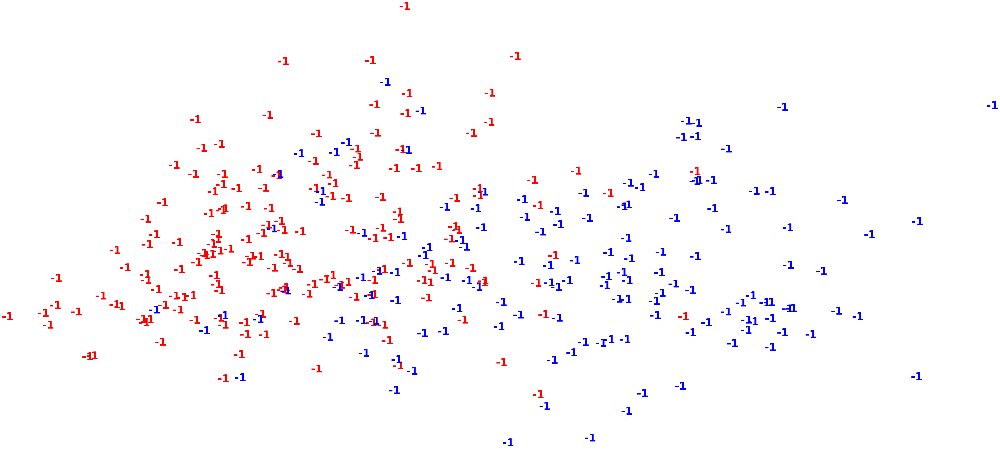

In [4]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

**Sonuçların hepsi -1 çıktı. Korkunç bir tablo.**

In [5]:
dbscan_cluster = DBSCAN(eps=5, min_samples=10)

clusters = dbscan_cluster.fit_predict(X_std)

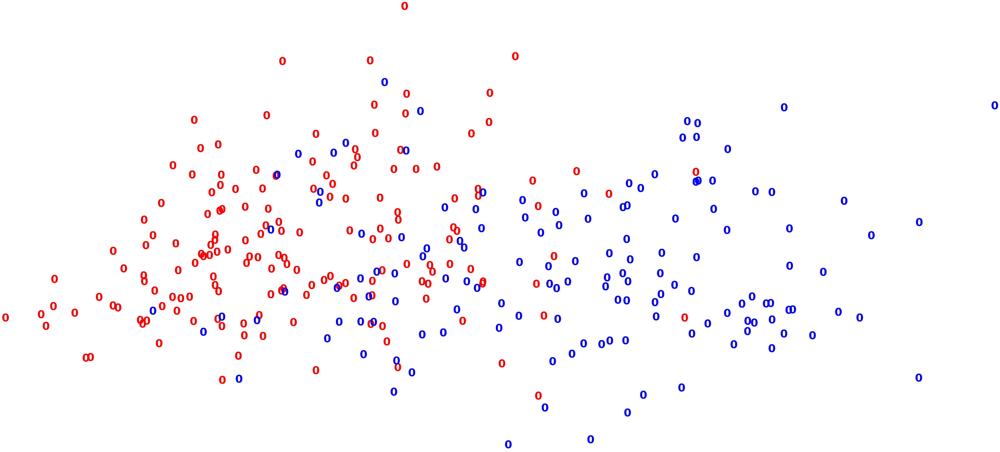

In [6]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

**Hepsini 0 olarak algıladı. İki çıktı olması gerekiyordu.**

In [7]:
dbscan_cluster = DBSCAN(eps=3, min_samples=5)

clusters = dbscan_cluster.fit_predict(X_std)

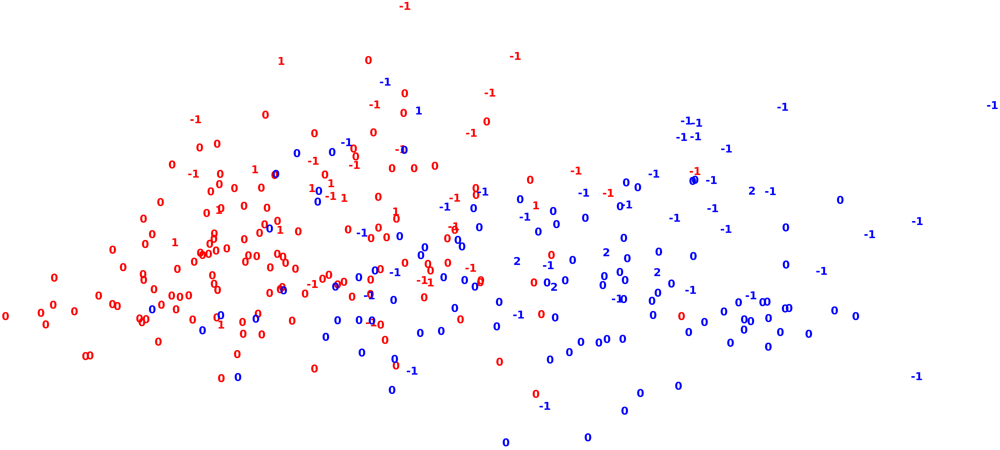

In [8]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

**Çıktılarda -1,0,1 ve 2 olduğu görülmekte.Bu sefer fazladan bir sınıflandırma yaptı ve -1 ler yine bir hayli fazla.**

In [9]:
dbscan_cluster = DBSCAN(eps=10, min_samples=5)

clusters = dbscan_cluster.fit_predict(X_std)

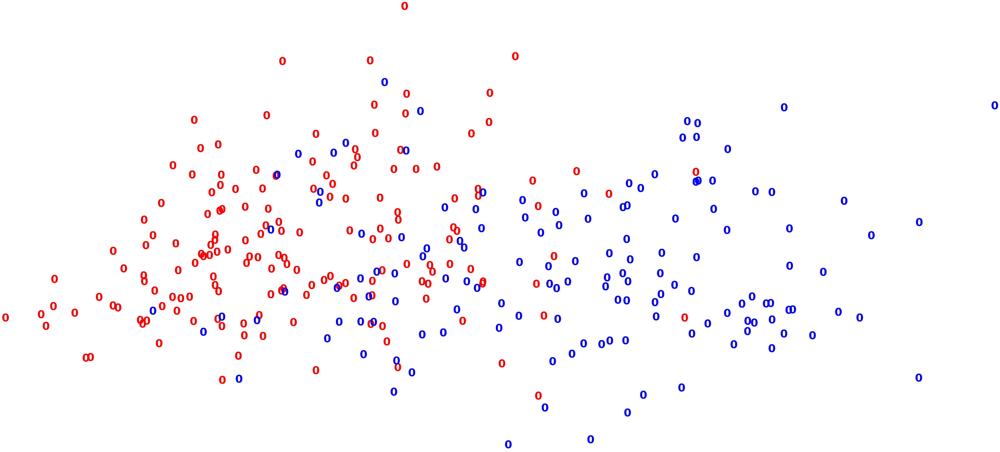

In [10]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

**Denediğimiz yollarda ikili bir kümeleme elde edemedik.**

### eps = 1, min_samples = 1, metric =" euclidean " şeklinde parametreleri ayarlayarak DBSCAN uygulayın. Ardından, min_samples değerini artırın. Artışın kümelerinin sayısı üzerindeki etkisi nedir?

In [11]:
dbscan_cluster = DBSCAN(eps=1, min_samples=1)

clusters = dbscan_cluster.fit_predict(X_std)

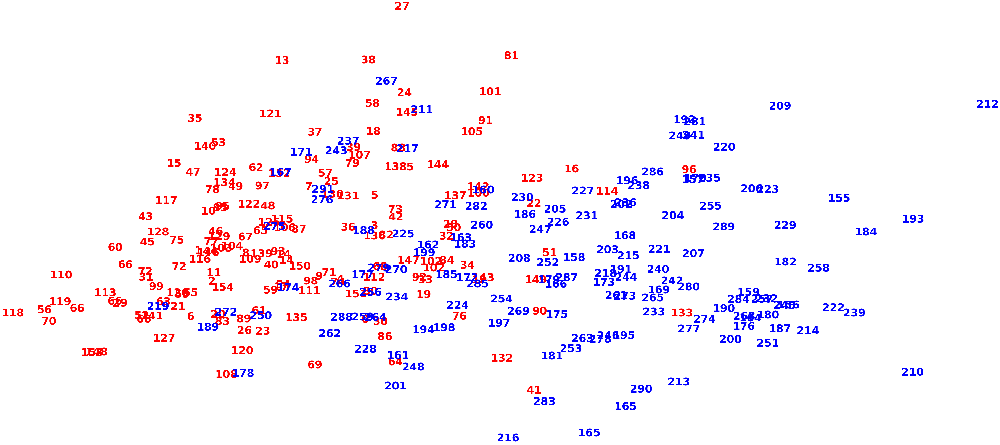

In [12]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

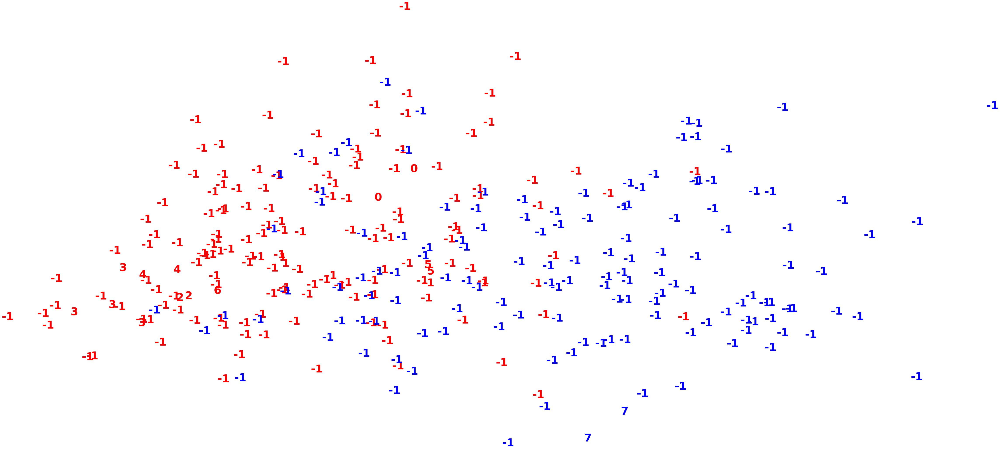

min samples değeri : 2
--------------------------------------------------------------------------------------------------------------


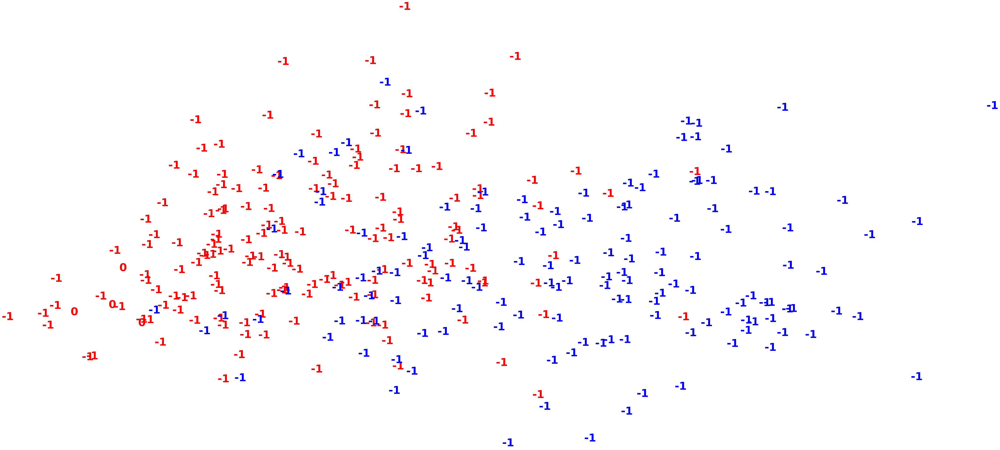

min samples değeri : 3
--------------------------------------------------------------------------------------------------------------


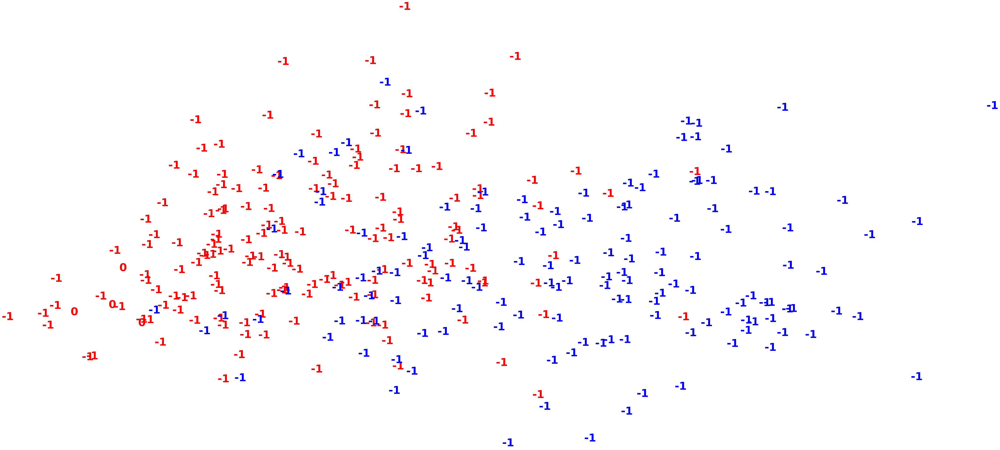

min samples değeri : 4
--------------------------------------------------------------------------------------------------------------


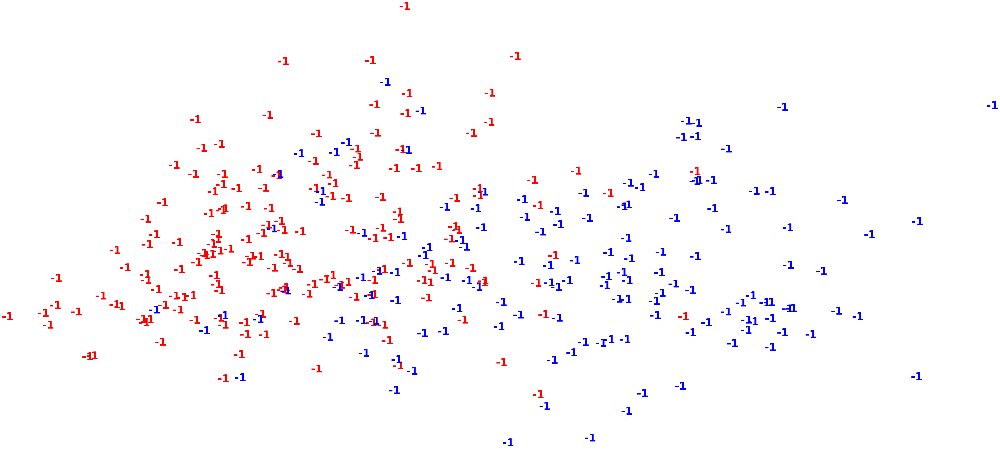

min samples değeri : 5
--------------------------------------------------------------------------------------------------------------


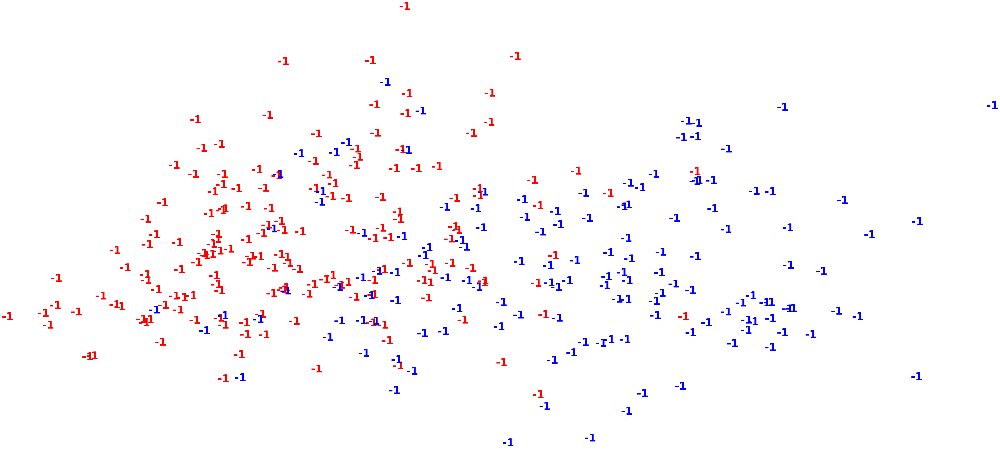

min samples değeri : 6
--------------------------------------------------------------------------------------------------------------


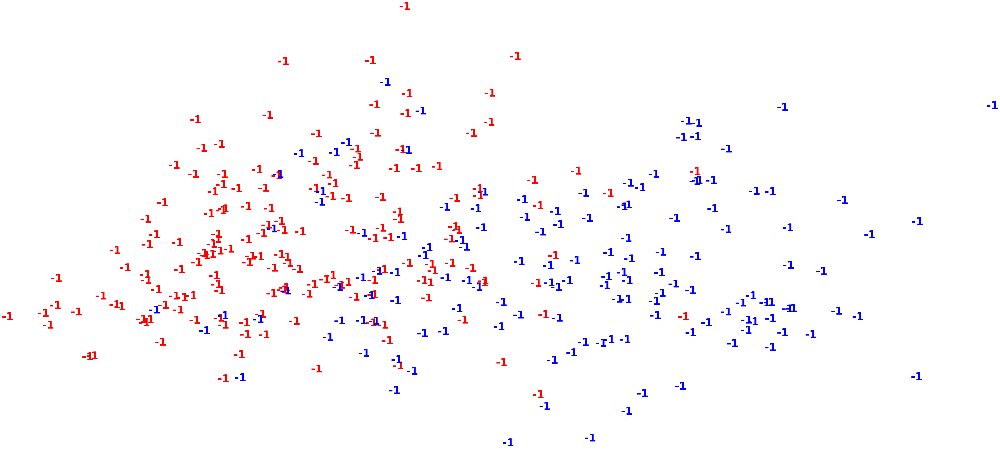

min samples değeri : 7
--------------------------------------------------------------------------------------------------------------


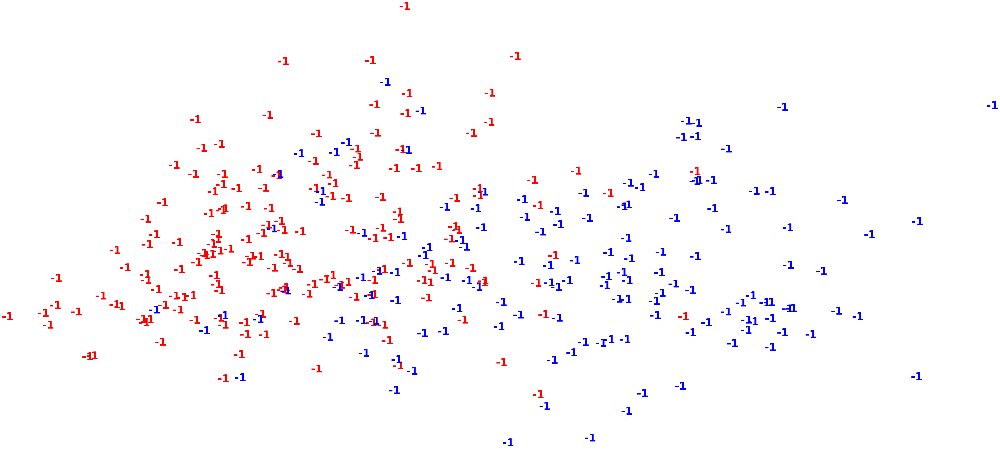

min samples değeri : 8
--------------------------------------------------------------------------------------------------------------


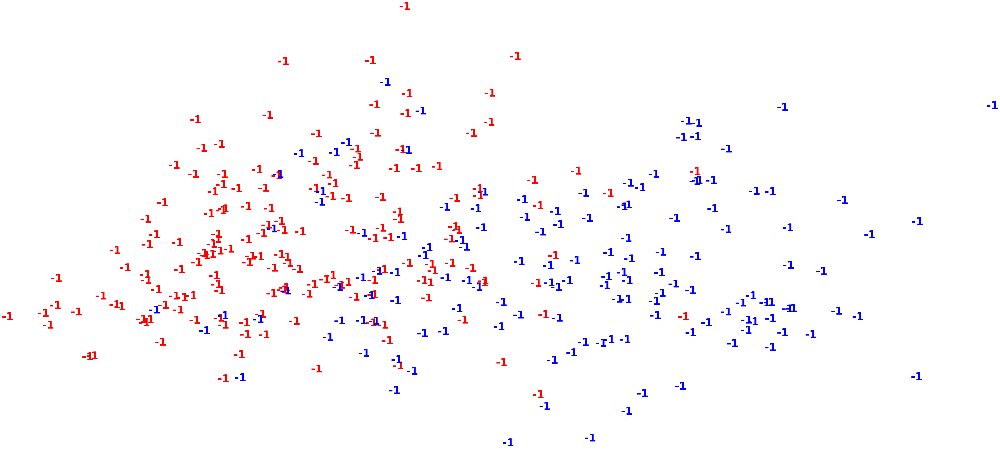

min samples değeri : 9
--------------------------------------------------------------------------------------------------------------


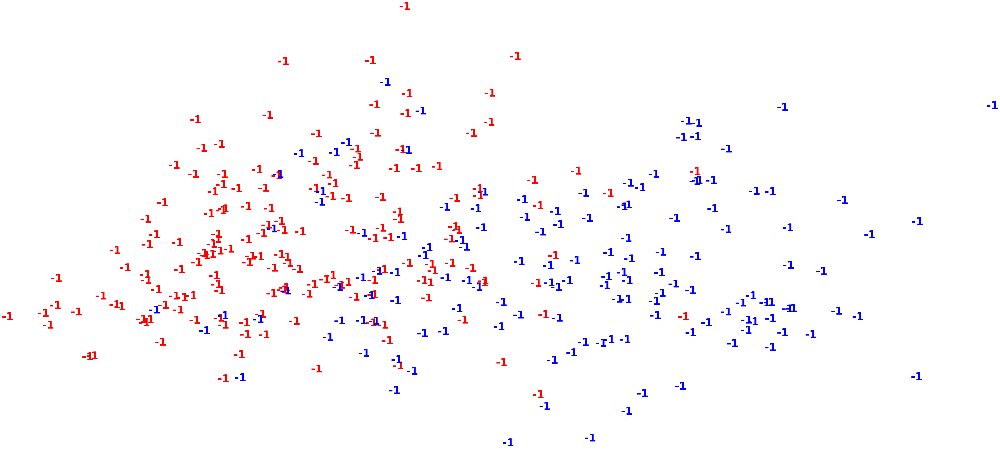

min samples değeri : 10
--------------------------------------------------------------------------------------------------------------


In [13]:
for n in range(2,11):
    dbscan_cluster = DBSCAN(eps=1, min_samples=n)
    clusters = dbscan_cluster.fit_predict(X_std)
    pca = PCA(n_components=2).fit_transform(X_std)

    plt.figure(figsize=(10,5))
    colours = 'rbg'
    for i in range(pca.shape[0]):
        plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.show()
    
    print("min samples değeri : {}".format(n))
    print("--------------------------------------------------------------------------------------------------------------")
    

**min_samples'ı arttırmak bir işe yaramadı. Şimdi de eps değerini arttıralım.**

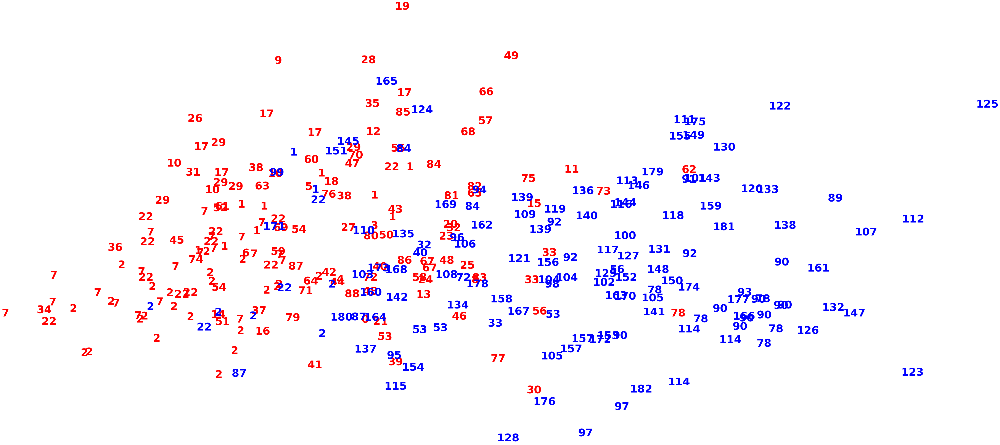

eps değeri : 2
--------------------------------------------------------------------------------------------------------------


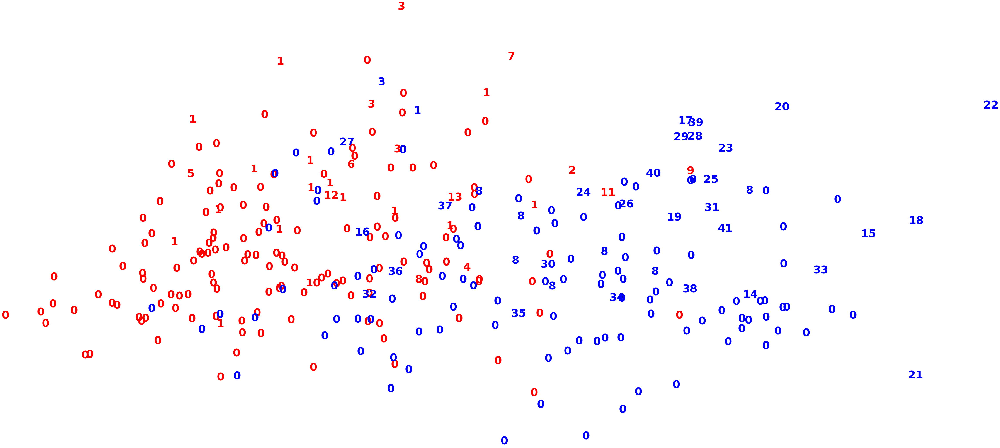

eps değeri : 3
--------------------------------------------------------------------------------------------------------------


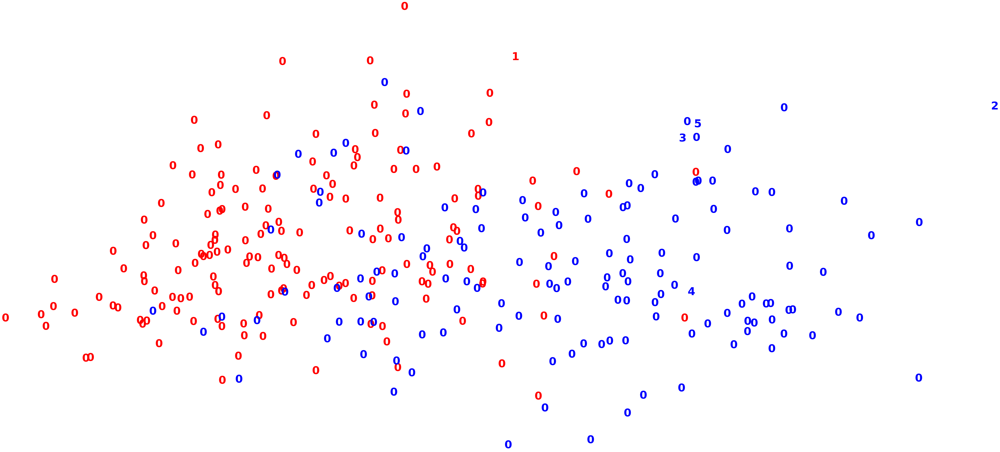

eps değeri : 4
--------------------------------------------------------------------------------------------------------------


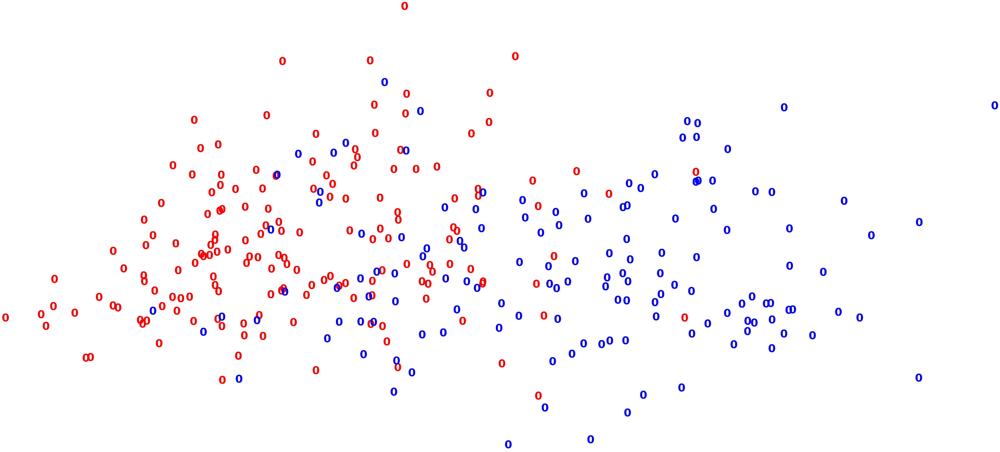

eps değeri : 5
--------------------------------------------------------------------------------------------------------------


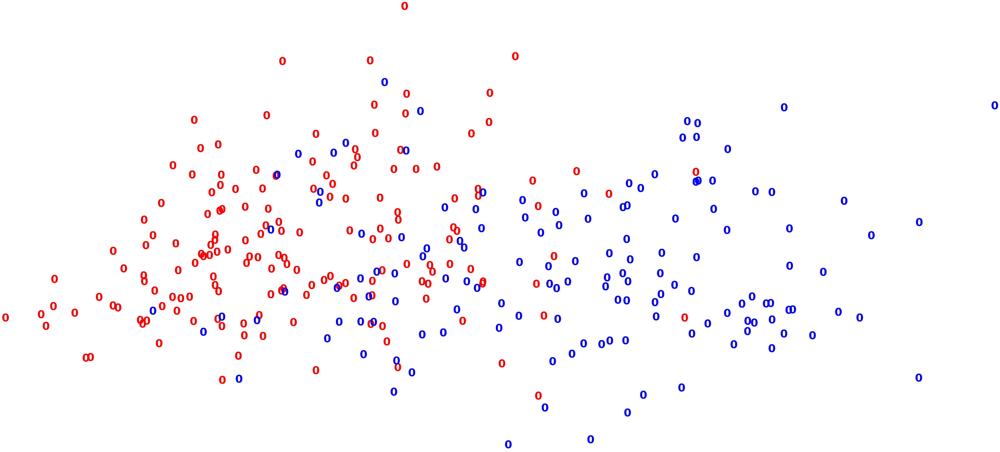

eps değeri : 6
--------------------------------------------------------------------------------------------------------------


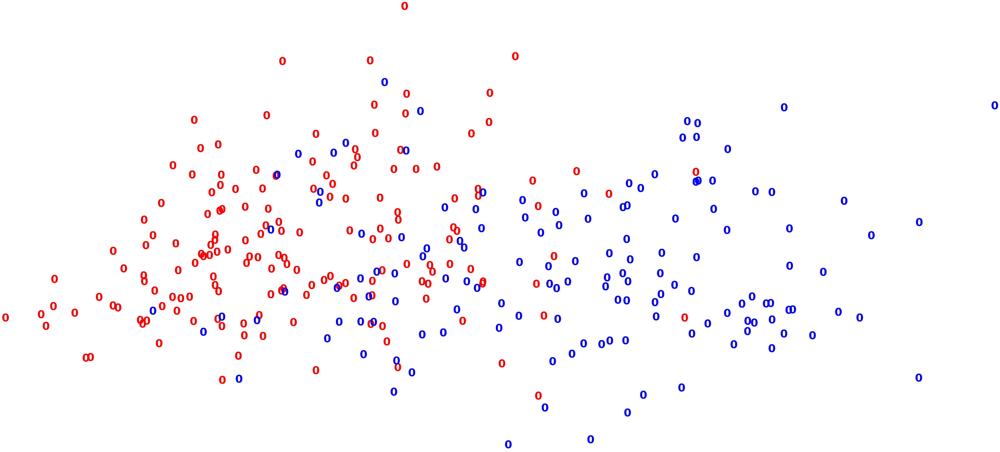

eps değeri : 7
--------------------------------------------------------------------------------------------------------------


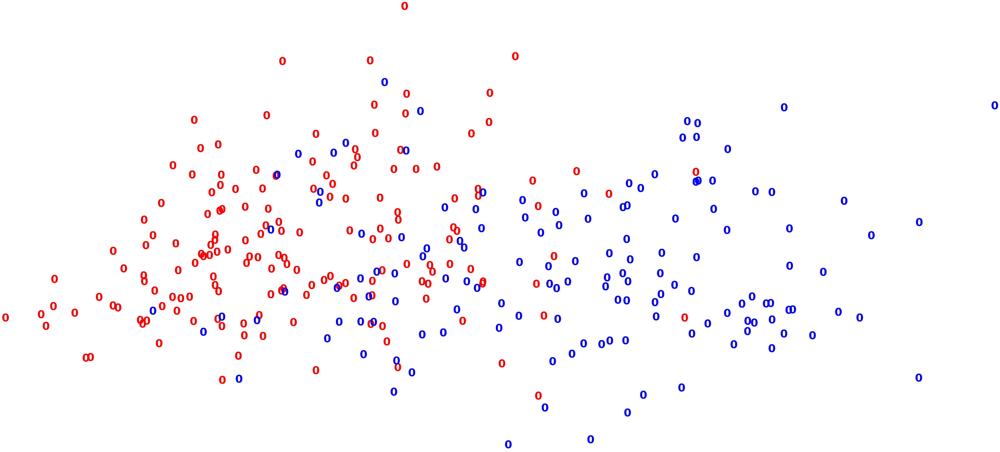

eps değeri : 8
--------------------------------------------------------------------------------------------------------------


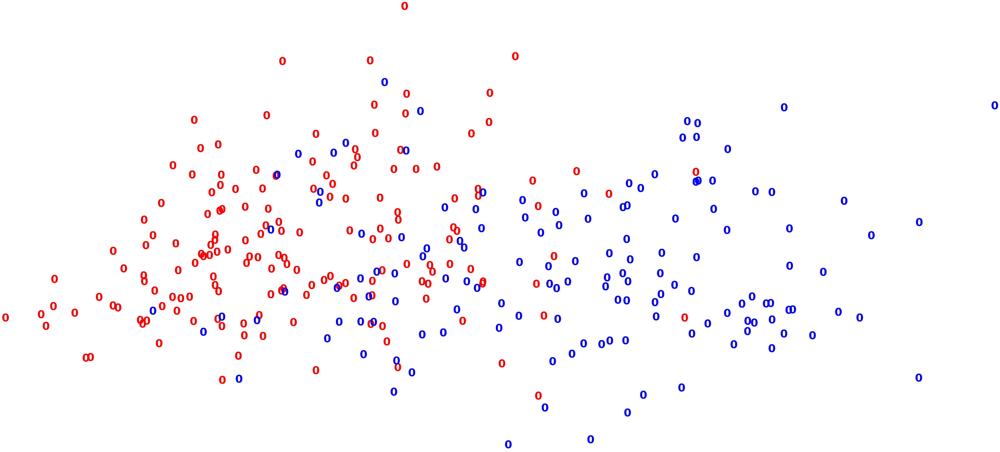

eps değeri : 9
--------------------------------------------------------------------------------------------------------------


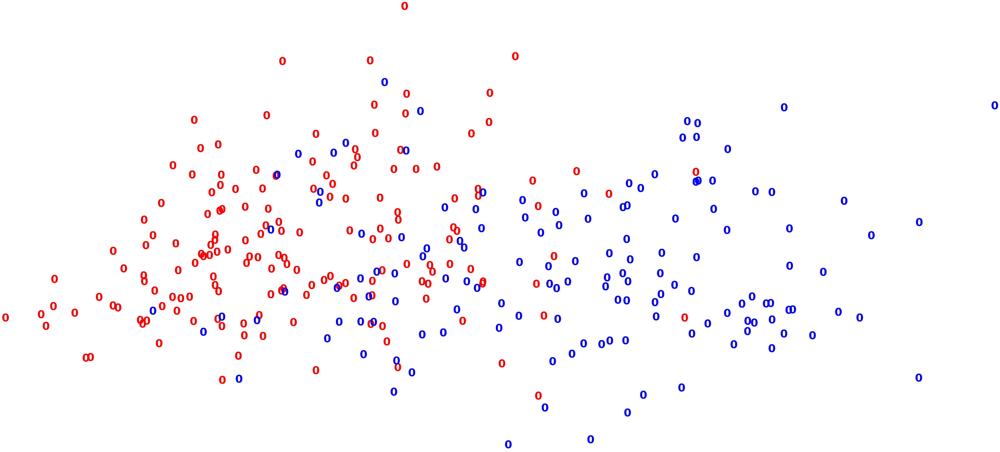

eps değeri : 10
--------------------------------------------------------------------------------------------------------------


In [14]:
for n in range(2,11):
    dbscan_cluster = DBSCAN(eps=n, min_samples=1)
    clusters = dbscan_cluster.fit_predict(X_std)
    pca = PCA(n_components=2).fit_transform(X_std)

    plt.figure(figsize=(10,5))
    colours = 'rbg'
    for i in range(pca.shape[0]):
        plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             color=colours[y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.show()
    print("eps değeri : {}".format(n))
    print("--------------------------------------------------------------------------------------------------------------")

**eps değeri arttıkça küme sayısı azaldı ve 0 a sabitlendi.**

**Şimdi iki değer için de for döngüsüne sokalım ve sonuçları gözlemleyelim.**

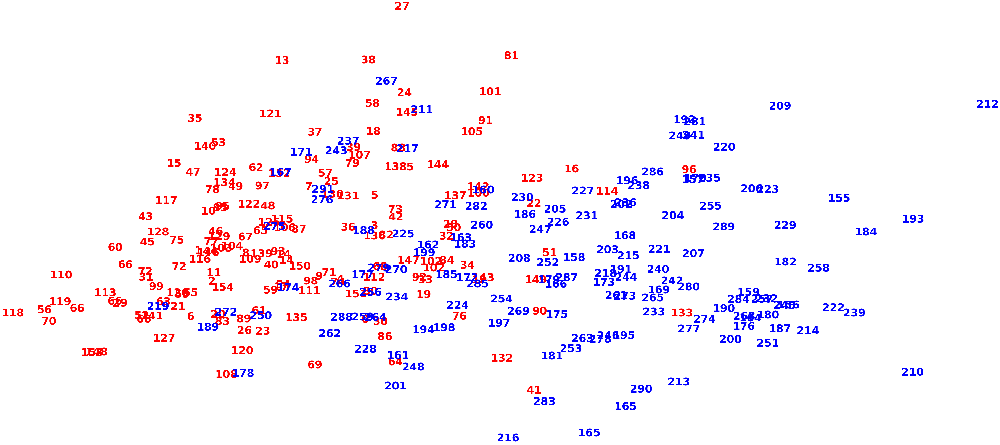

eps değeri : 1
min_samples değeri:1
--------------------------------------------------------------------------------------------------------------


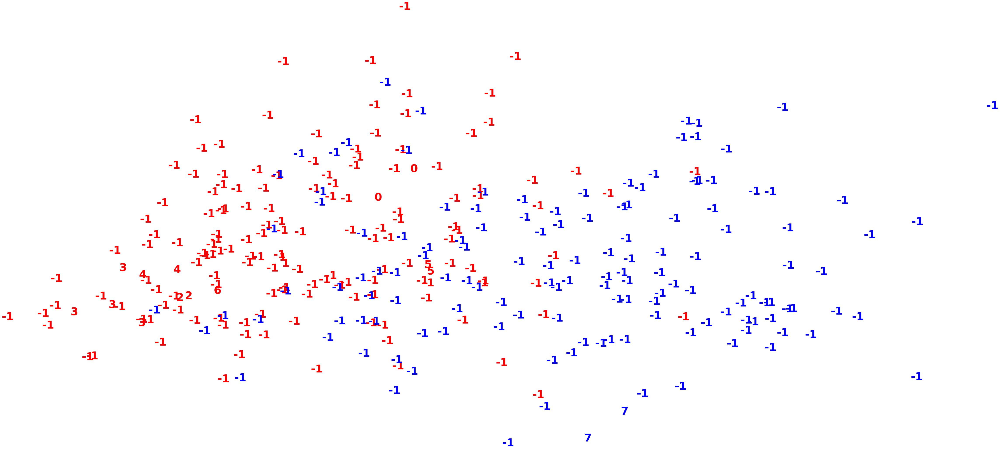

eps değeri : 1
min_samples değeri:2
--------------------------------------------------------------------------------------------------------------


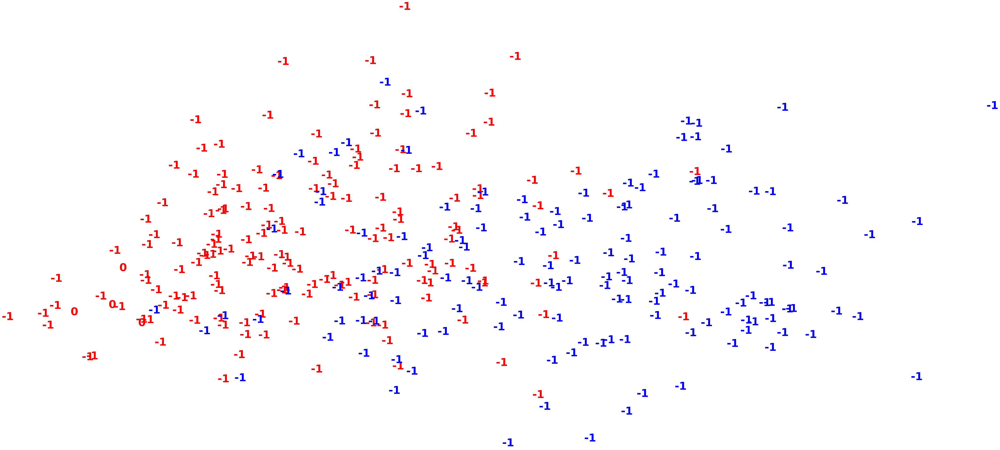

eps değeri : 1
min_samples değeri:3
--------------------------------------------------------------------------------------------------------------


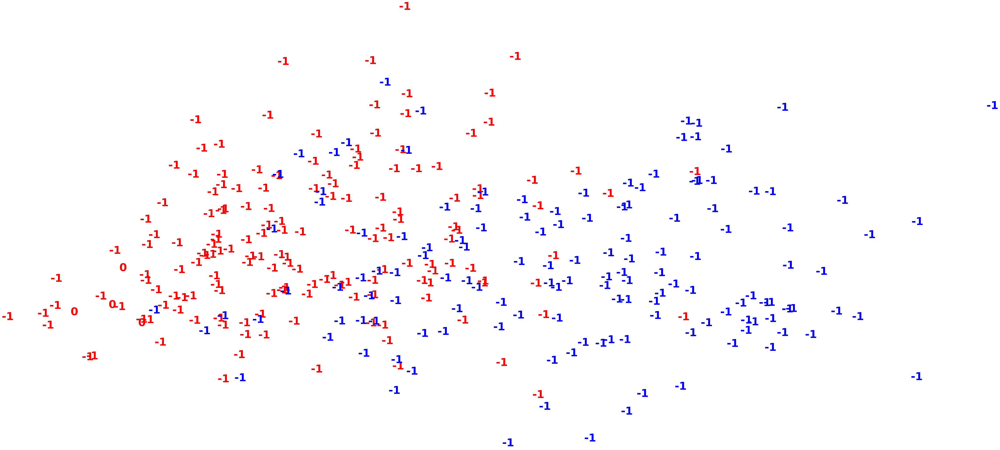

eps değeri : 1
min_samples değeri:4
--------------------------------------------------------------------------------------------------------------


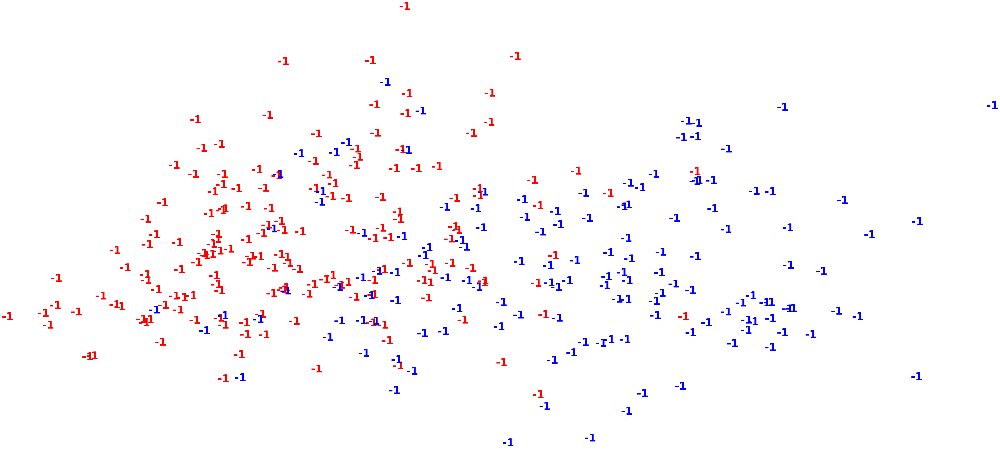

eps değeri : 1
min_samples değeri:5
--------------------------------------------------------------------------------------------------------------


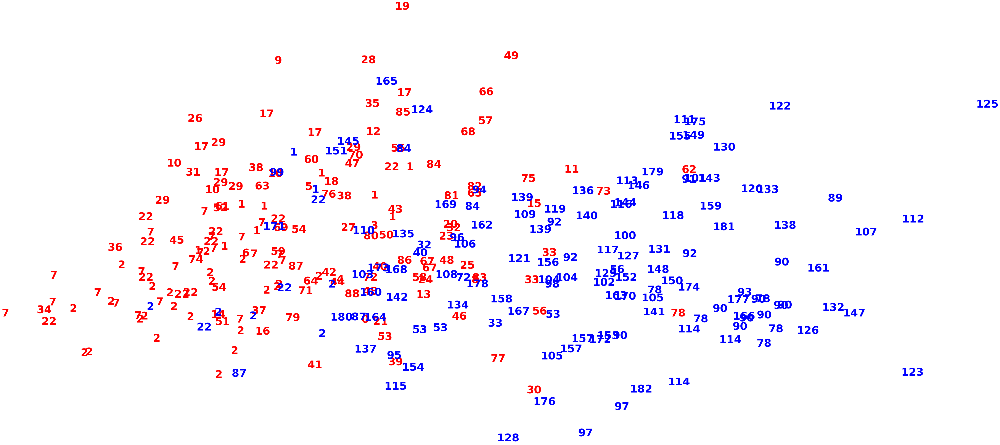

eps değeri : 2
min_samples değeri:1
--------------------------------------------------------------------------------------------------------------


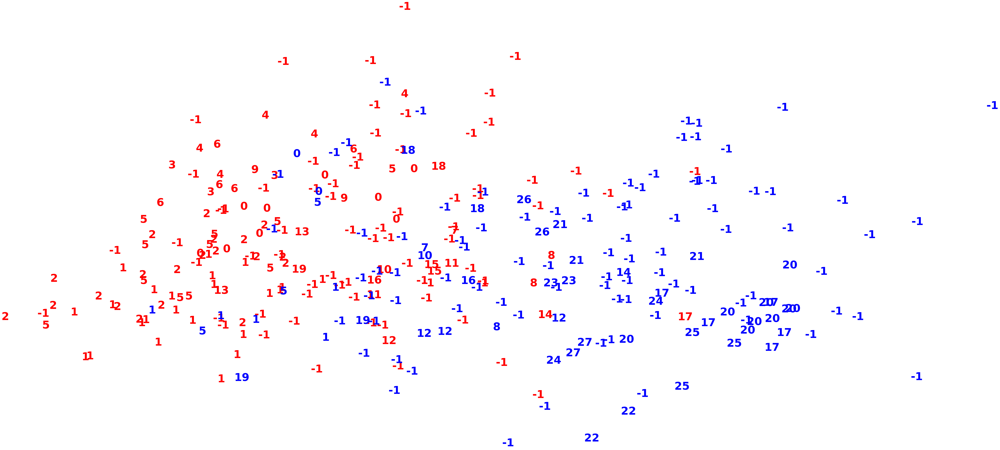

eps değeri : 2
min_samples değeri:2
--------------------------------------------------------------------------------------------------------------


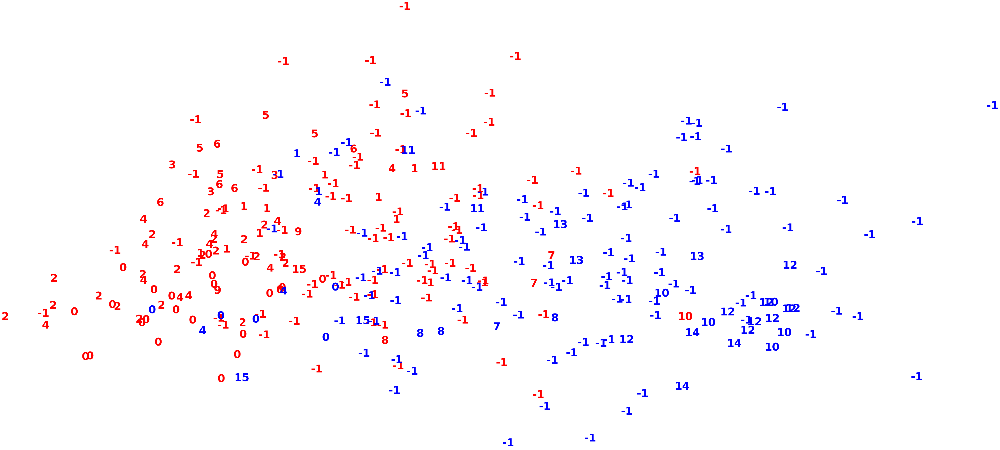

eps değeri : 2
min_samples değeri:3
--------------------------------------------------------------------------------------------------------------


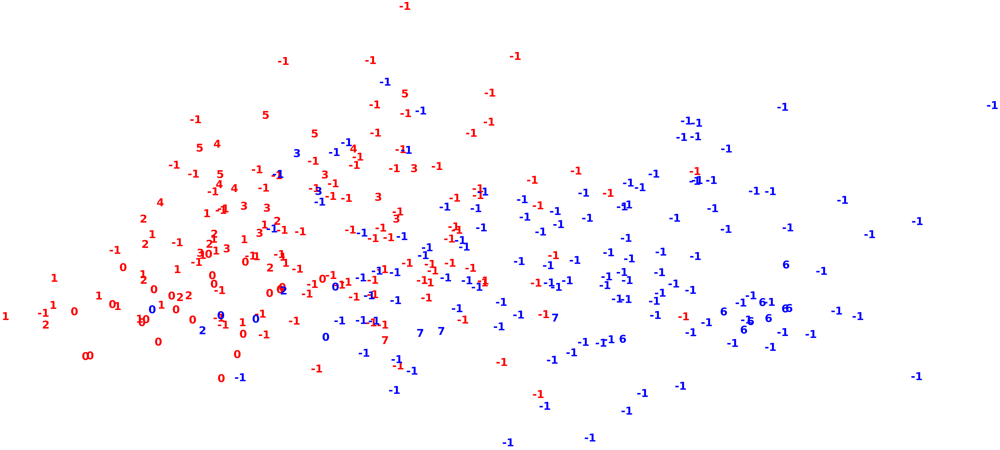

eps değeri : 2
min_samples değeri:4
--------------------------------------------------------------------------------------------------------------


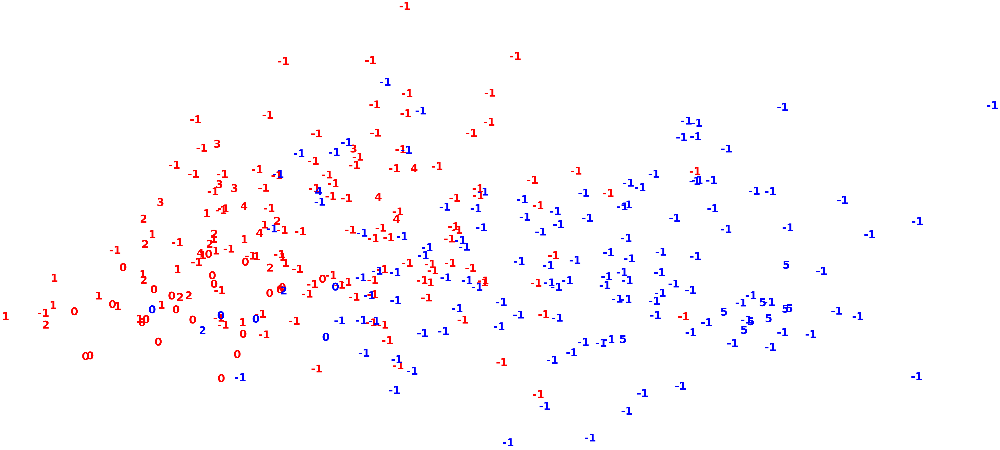

eps değeri : 2
min_samples değeri:5
--------------------------------------------------------------------------------------------------------------


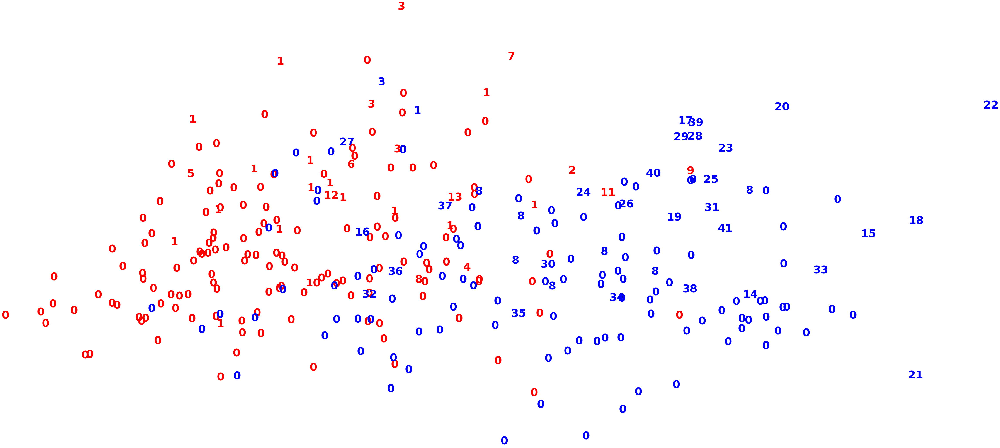

eps değeri : 3
min_samples değeri:1
--------------------------------------------------------------------------------------------------------------


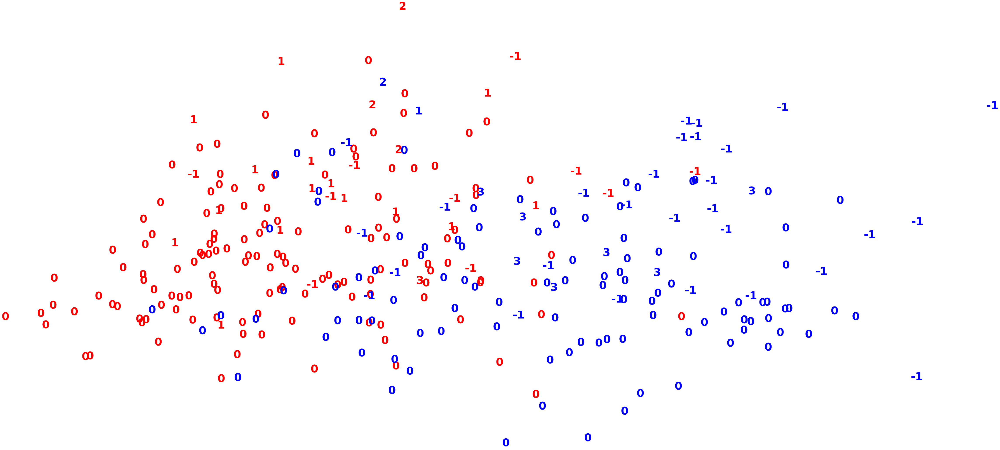

eps değeri : 3
min_samples değeri:2
--------------------------------------------------------------------------------------------------------------


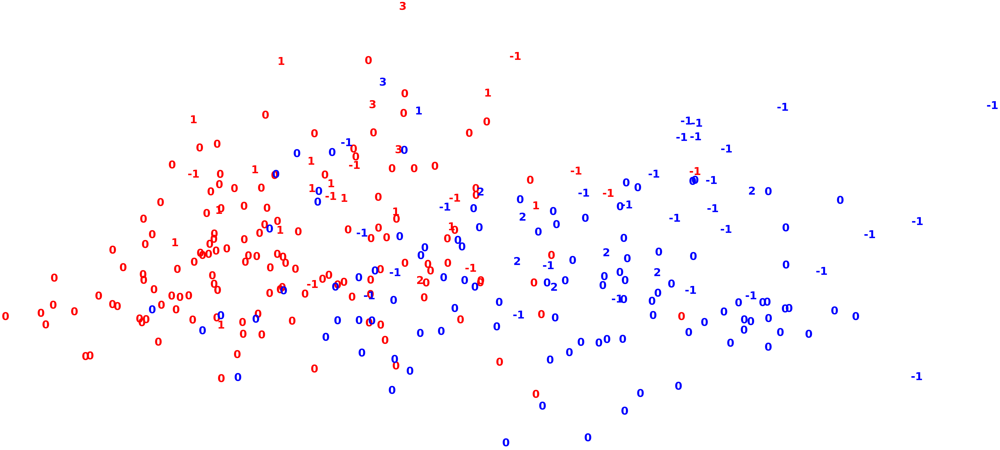

eps değeri : 3
min_samples değeri:3
--------------------------------------------------------------------------------------------------------------


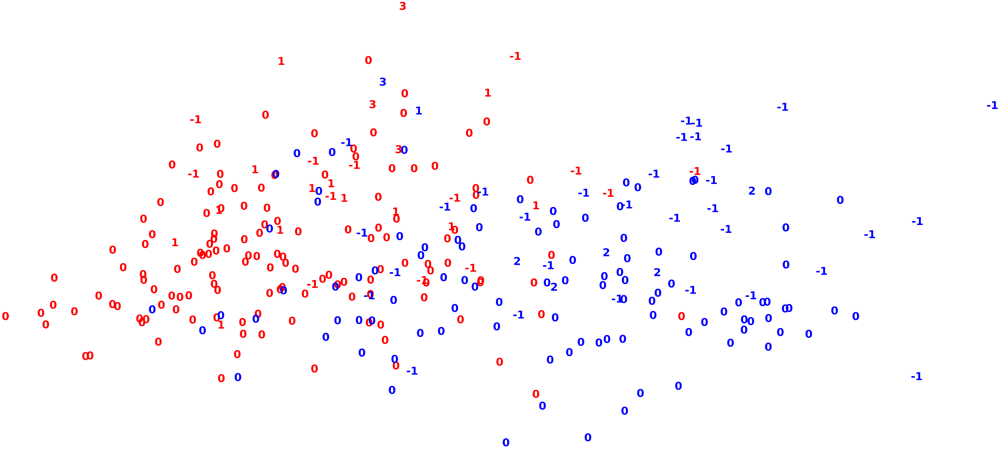

eps değeri : 3
min_samples değeri:4
--------------------------------------------------------------------------------------------------------------


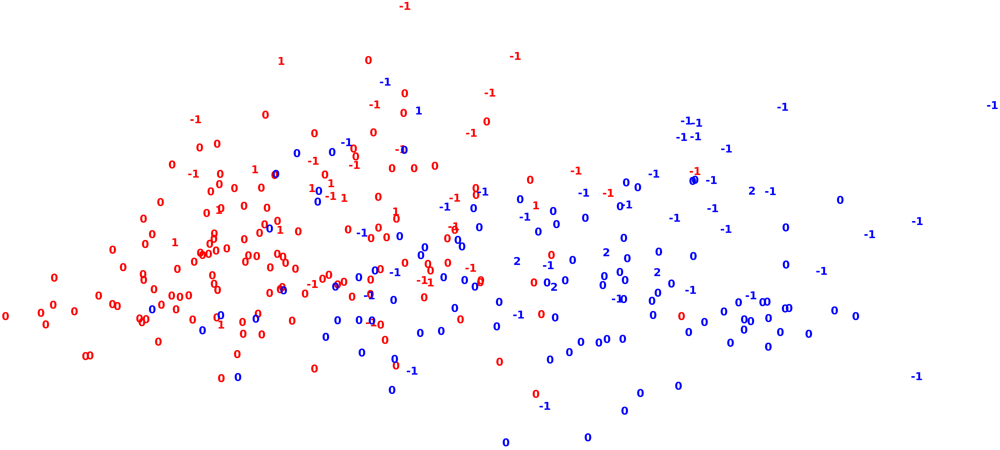

eps değeri : 3
min_samples değeri:5
--------------------------------------------------------------------------------------------------------------


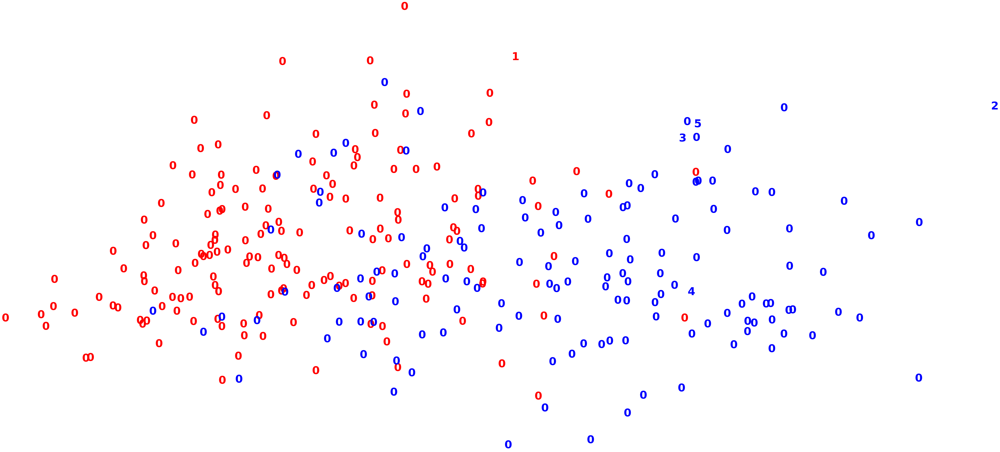

eps değeri : 4
min_samples değeri:1
--------------------------------------------------------------------------------------------------------------


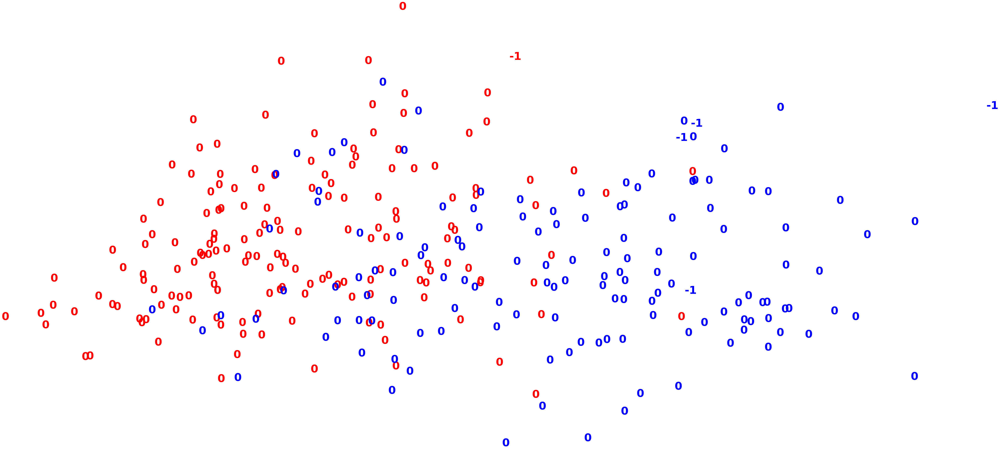

eps değeri : 4
min_samples değeri:2
--------------------------------------------------------------------------------------------------------------


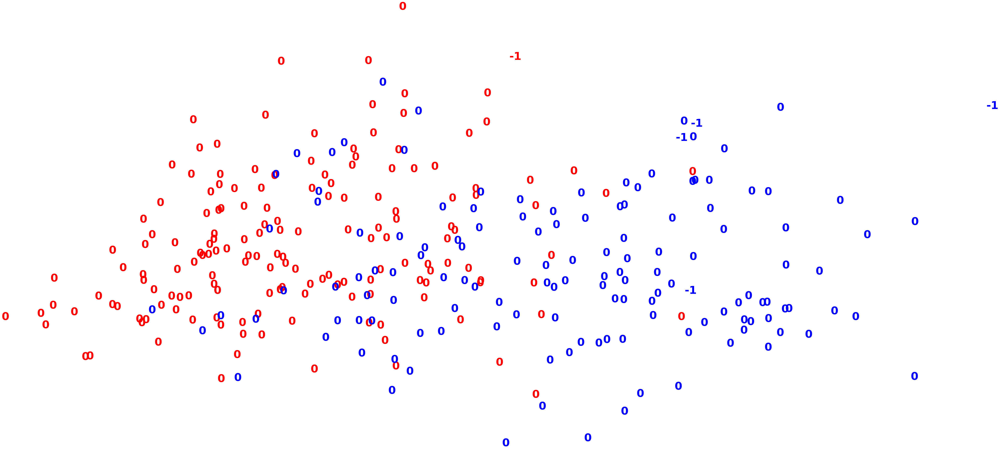

eps değeri : 4
min_samples değeri:3
--------------------------------------------------------------------------------------------------------------


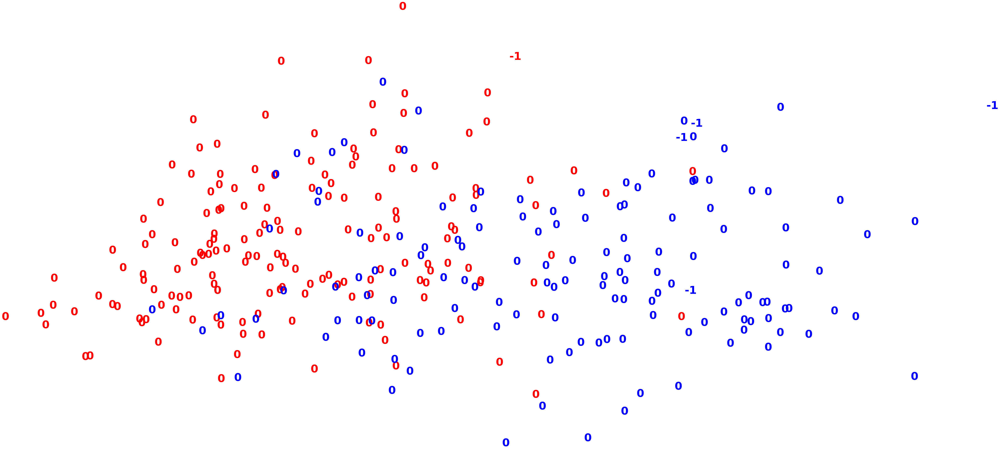

eps değeri : 4
min_samples değeri:4
--------------------------------------------------------------------------------------------------------------


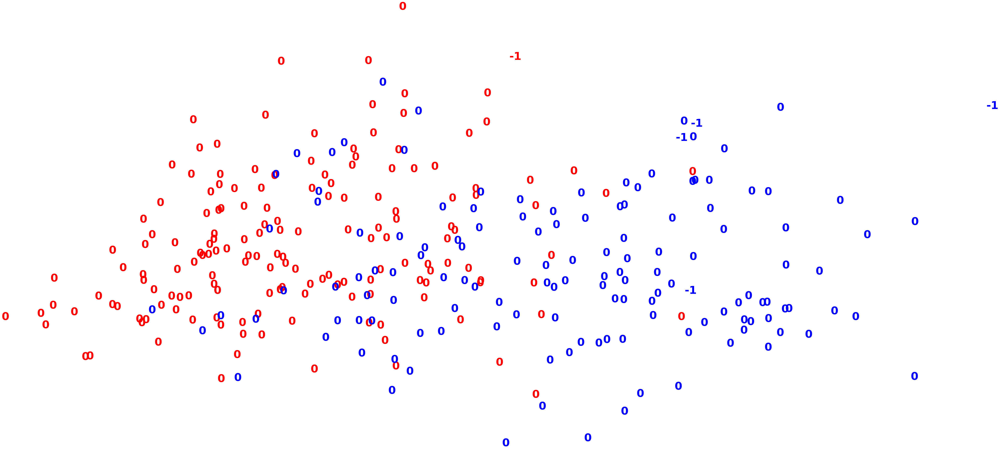

eps değeri : 4
min_samples değeri:5
--------------------------------------------------------------------------------------------------------------


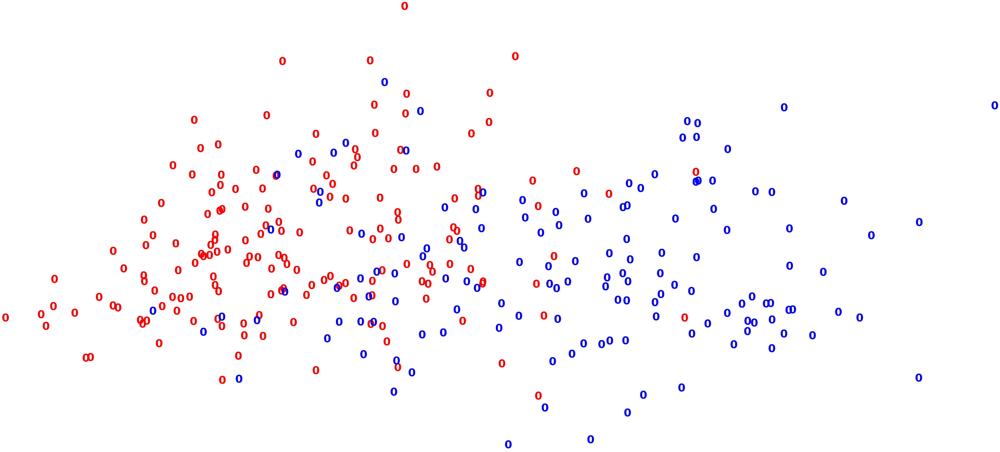

eps değeri : 5
min_samples değeri:1
--------------------------------------------------------------------------------------------------------------


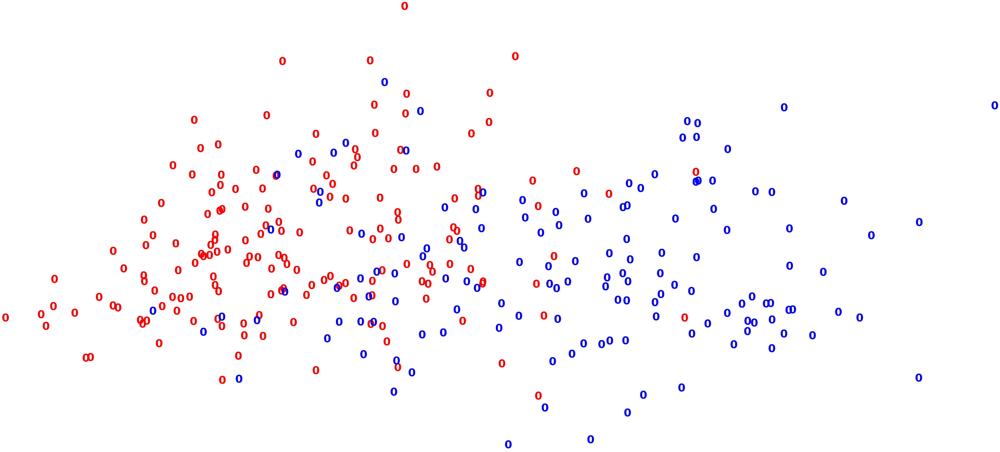

eps değeri : 5
min_samples değeri:2
--------------------------------------------------------------------------------------------------------------


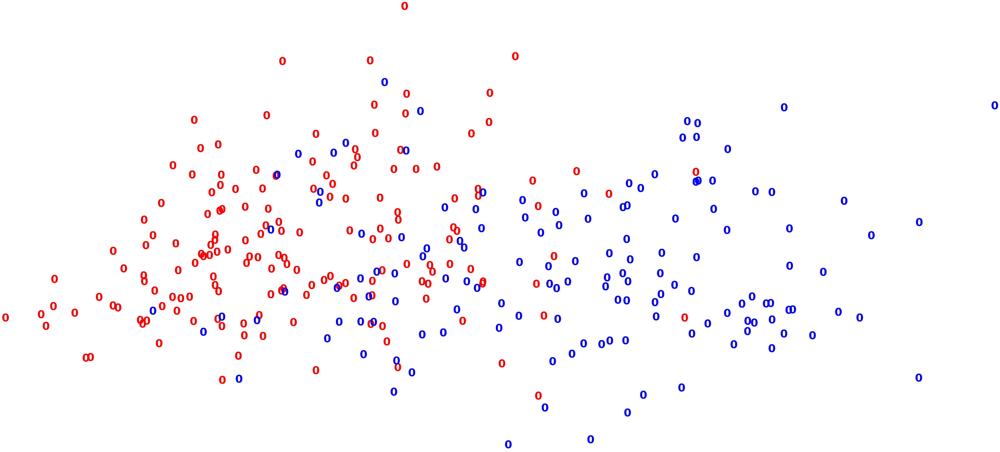

eps değeri : 5
min_samples değeri:3
--------------------------------------------------------------------------------------------------------------


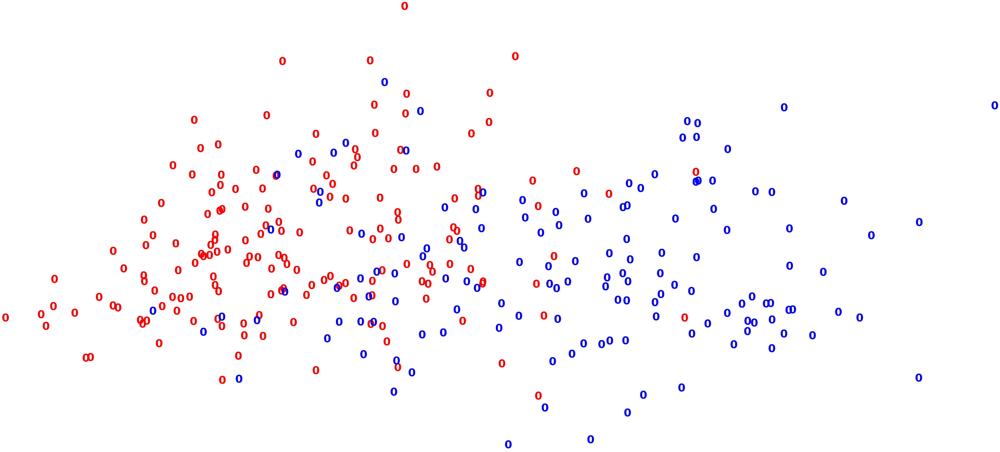

eps değeri : 5
min_samples değeri:4
--------------------------------------------------------------------------------------------------------------


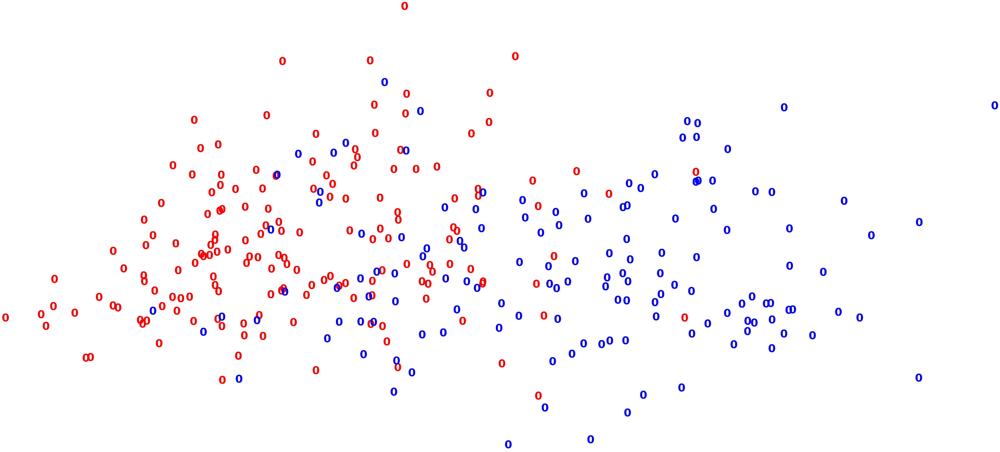

eps değeri : 5
min_samples değeri:5
--------------------------------------------------------------------------------------------------------------


In [15]:
for n in range(1,6):
    for k in range (1,6):
        dbscan_cluster = DBSCAN(eps=n, min_samples=k)
        clusters = dbscan_cluster.fit_predict(X_std)
        pca = PCA(n_components=2).fit_transform(X_std)

        plt.figure(figsize=(10,5))
        colours = 'rbg'
        for i in range(pca.shape[0]):
            plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
                 color=colours[y[i]],
                 fontdict={'weight': 'bold', 'size': 50}
            )
    
        plt.xticks([])
        plt.yticks([])
        plt.axis('off')
        plt.show()
        print("eps değeri : {}".format(n))
        print("min_samples değeri:{}".format(k))
        print("--------------------------------------------------------------------------------------------------------------")

**Sonuçlara baktığımızda istediğimiz gibi ayırması gereken hiçbir kümeleme olmadı. En yakın olanlar;**

eps değeri : 3
min_samples değeri:2

eps değeri : 3
min_samples değeri:3

eps değeri : 3
min_samples değeri:4

eps değeri : 3
min_samples değeri:5

Ancak bu değerler de pek kullanılabilir değiller.Ya çok fazla kümeye ayırdı ya da çok fazla gürültü içerdi.

In [19]:
dbscan_cluster = DBSCAN(eps=3, min_samples=5)

clusters = dbscan_cluster.fit_predict(X_std)

In [20]:
print("GMM çözümünün Düzeltilmiş Rand Endeksi (ARI): {:.3f}"
      .format(metrics.adjusted_rand_score(y, clusters)))
print("GMM çözümünün siluet skoru                  : {:.3f}"
      .format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))

GMM çözümünün Düzeltilmiş Rand Endeksi (ARI): 0.020
GMM çözümünün siluet skoru                  : 0.048
